In [4]:
import pandas as pd

# Load the data from a CSV file
df = pd.read_csv('/Users/tharunyakatikireddy/Downloads/ratio_comparison_with_continent.csv')

In [5]:
# Convert 'Year' to integer if necessary, handling errors for unexpected formats
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')

# Drop rows where 'Year' or other critical columns are missing
df.dropna(subset=['Year', 'Aspect Ratio', 'Closer to Ratio'], inplace=True)


In [6]:
# Group by Country and Year to calculate mean aspect ratio and count closer to ratio categories
grouped_data = df.groupby(['Country', 'Year']).agg({
    'Aspect Ratio': 'mean',
    'Closer to Ratio': lambda x: x.value_counts().to_dict()
}).reset_index()


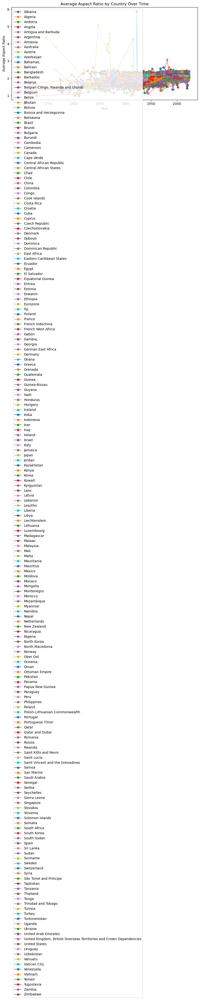

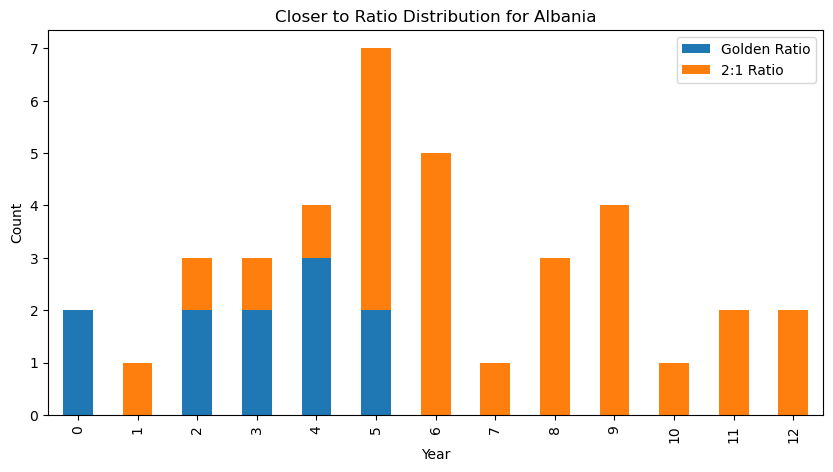

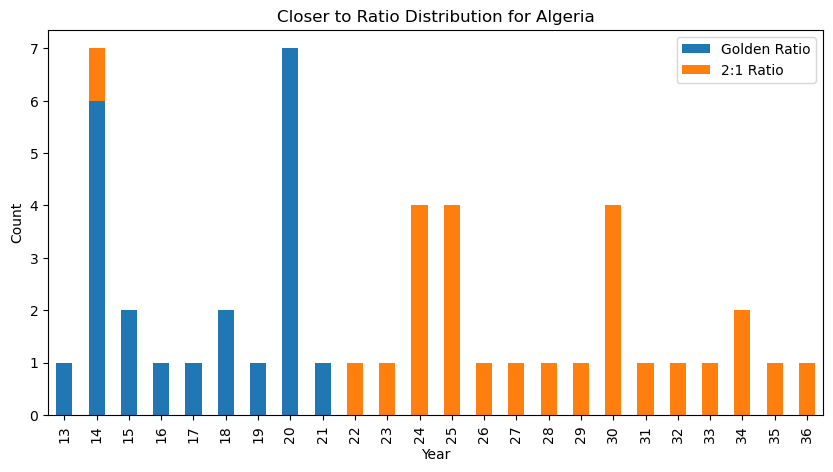

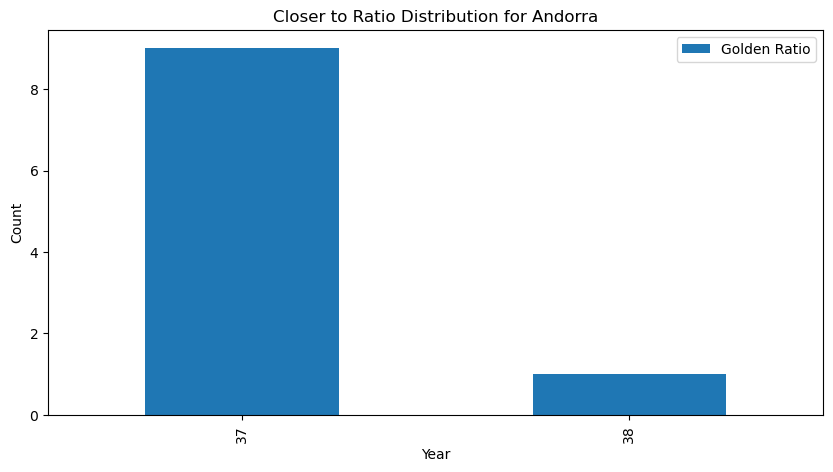

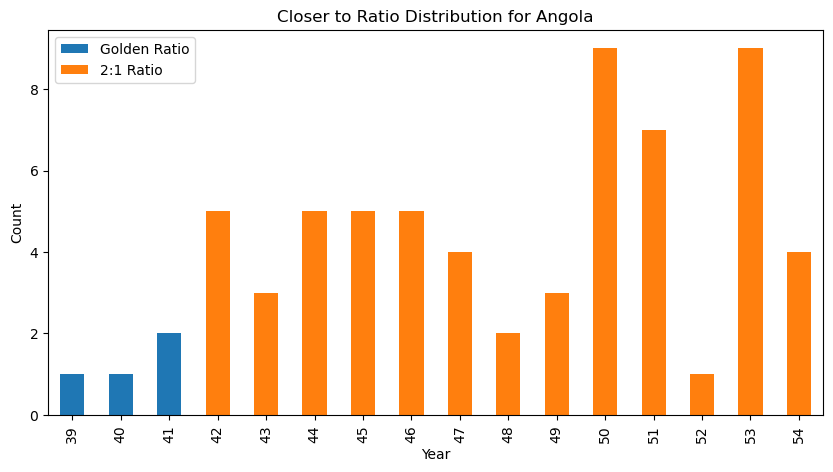

...

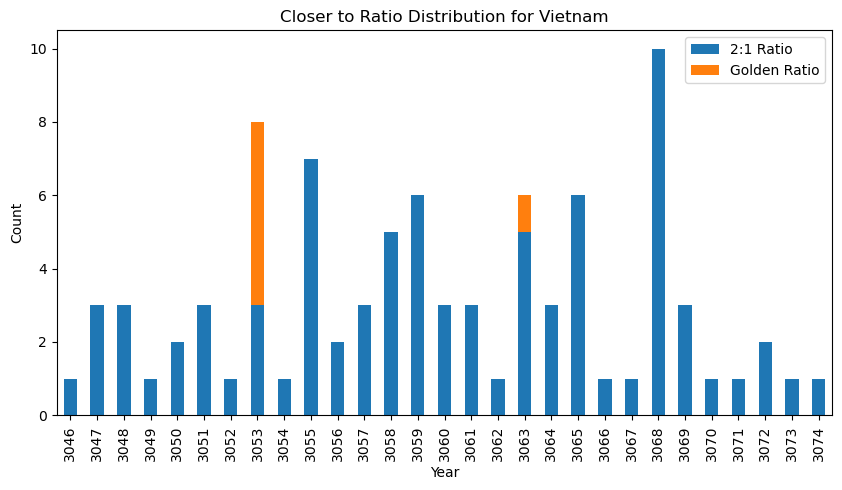

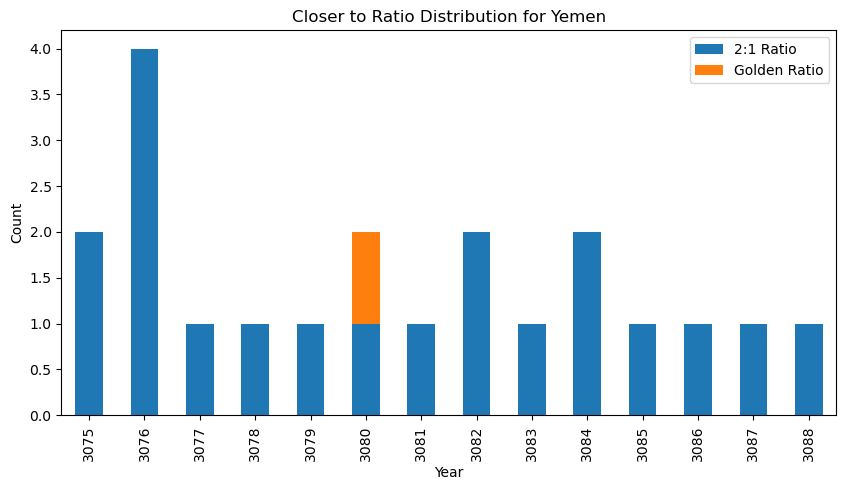

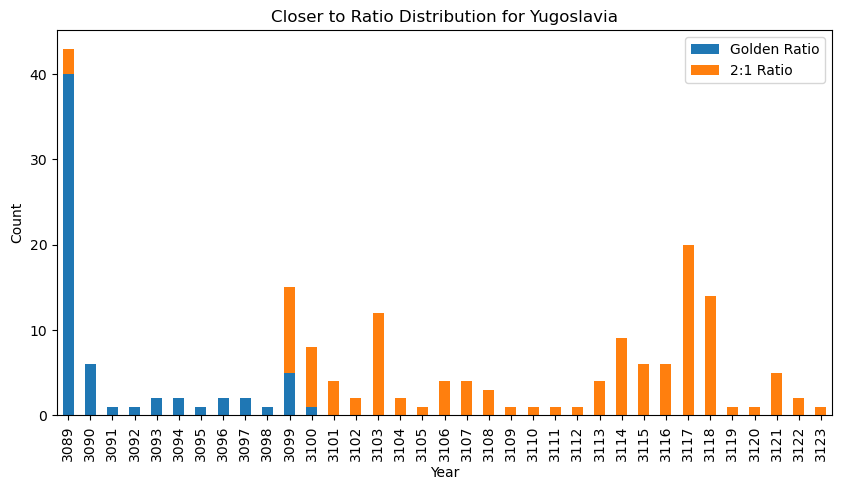

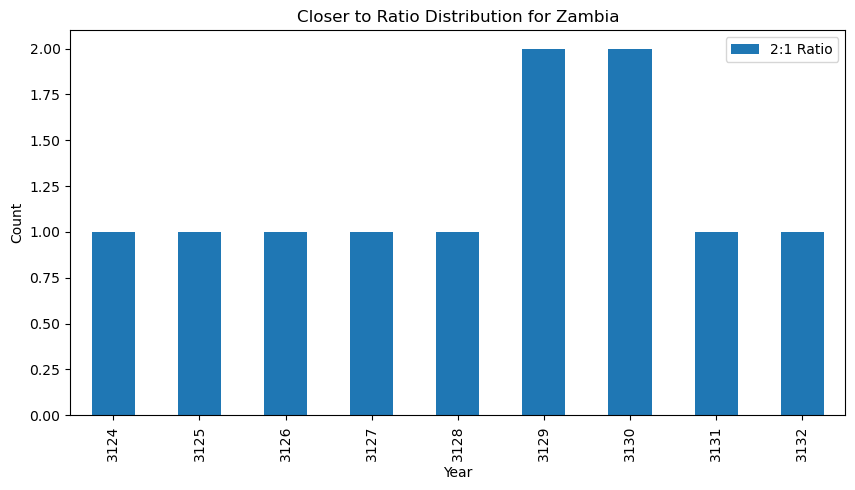

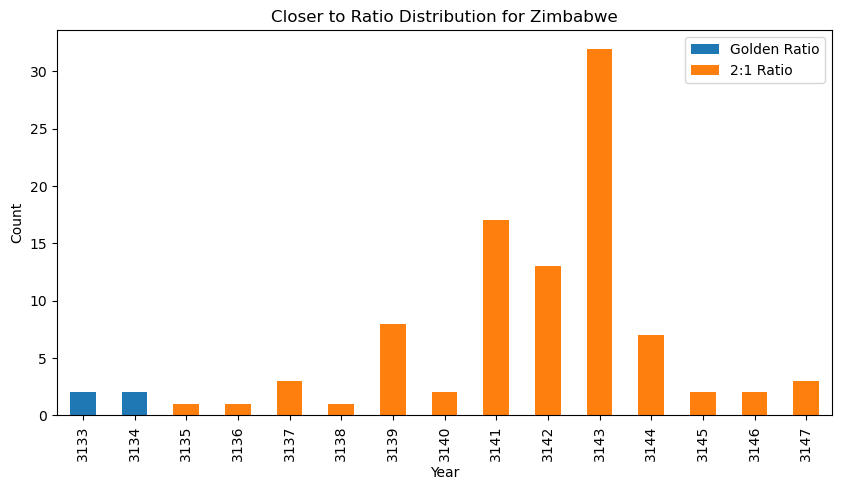

In [7]:
import matplotlib.pyplot as plt

# Create line plots for average aspect ratio
plt.figure(figsize=(10, 5))
for country in grouped_data['Country'].unique():
    country_data = grouped_data[grouped_data['Country'] == country]
    plt.plot(country_data['Year'], country_data['Aspect Ratio'], marker='o', label=country)

plt.title('Average Aspect Ratio by Country Over Time')
plt.xlabel('Year')
plt.ylabel('Average Aspect Ratio')
plt.legend()
plt.show()

# Create bar charts for "Closer to Ratio" category counts
for country in grouped_data['Country'].unique():
    country_data = grouped_data[grouped_data['Country'] == country]
    years = country_data['Year']
    ratios = country_data['Closer to Ratio'].apply(pd.Series)
    ratios.plot(kind='bar', stacked=True, figsize=(10, 5))
    plt.title(f'Closer to Ratio Distribution for {country}')
    plt.xlabel('Year')
    plt.ylabel('Count')
    plt.show()


In [8]:
import plotly.express as px

# Assuming 'grouped_data' is your DataFrame with countries, years, and aspect ratios
fig = px.line(grouped_data, x='Year', y='Aspect Ratio', color='Country',
              title='Average Aspect Ratio by Country Over Time',
              labels={'Aspect Ratio': 'Average Aspect Ratio', 'Year': 'Year'},
              line_shape='linear')  # Corrected to use a valid line shape

fig.update_layout(legend_title_text='Country')
fig.show()


In [9]:
import plotly.express as px
import pandas as pd

# Assuming 'grouped_data' has the 'Closer to Ratio' counts as a dictionary
# First, we need to convert this dictionary into a separate column for each ratio type
def expand_ratio_counts(row):
    ratios = {'Golden Ratio': 0, '2:1 Ratio': 0}
    if row['Closer to Ratio']:
        ratios.update(row['Closer to Ratio'])
    return pd.Series(ratios)

# Apply the function to expand ratio counts
expanded_ratios = grouped_data.apply(expand_ratio_counts, axis=1)
grouped_data = pd.concat([grouped_data, expanded_ratios], axis=1)

# Now create a plot for each country
for country in grouped_data['Country'].unique():
    country_data = grouped_data[grouped_data['Country'] == country]
    fig = px.bar(country_data, x='Year', y=['Golden Ratio', '2:1 Ratio'],
                 title=f'Closer to Ratio Counts Over Time for {country}',
                 labels={'value': 'Count', 'variable': 'Closer to Ratio'})
    fig.update_layout(barmode='stack', xaxis_title='Year', yaxis_title='Count')
    fig.show()


In [10]:
# Example country-to-continent mapping
continent_mapping = {
    'Asia': ['China', 'India', 'Japan'],  # Add other Asian countries
    'Europe': ['France', 'Germany', 'Italy'],  # Add other European countries
    'Africa': ['Nigeria', 'Egypt', 'South Africa'],  # Add other African countries
    'Americas': ['United States', 'Brazil', 'Canada'],  # Add other countries in the Americas
    'Oceania': ['Australia', 'New Zealand', 'Fiji']  # Add other Oceanian countries
}


In [11]:
print(grouped_data.columns)


Index(['Country', 'Year', 'Aspect Ratio', 'Closer to Ratio', 'Golden Ratio',
       '2:1 Ratio'],
      dtype='object')


In [12]:
import plotly.express as px

# Define country-to-continent mapping with realistic countries matching your dataset
continent_mapping = {
    'Asia': ['China', 'India', 'Japan'],  # Example countries
    'Europe': ['France', 'Germany', 'Italy'],
    'Africa': ['Nigeria', 'Egypt', 'South Africa'],
    'Americas': ['United States', 'Brazil', 'Canada'],
    'Oceania': ['Australia', 'New Zealand', 'Fiji']
}

# Calculate 'Aspect Ratio' for each row if not already calculated
grouped_data['Aspect Ratio'] = grouped_data['Golden Ratio'] / grouped_data['2:1 Ratio']  # Modify as needed

# Plotting data based on the continent mapping
for continent, countries in continent_mapping.items():
    subset = grouped_data[grouped_data['Country'].isin(countries)]
    if not subset.empty:  # Check if the subset has data
        fig = px.line(subset, x='Year', y='Aspect Ratio', color='Country',
                      title=f'Average Aspect Ratio in {continent}',
                      labels={'Aspect Ratio': 'Average Aspect Ratio', 'Year': 'Year'})
        fig.show()
    else:
        print(f"No data available for {continent}")


In [13]:
import plotly.express as px

# Define country-to-continent mapping with realistic countries matching your dataset
continent_mapping = {
    'Asia': ['China', 'India', 'Japan'],  # Example countries
    'Europe': ['France', 'Germany', 'Italy'],
    'Africa': ['Nigeria', 'Egypt', 'South Africa'],
    'Americas': ['United States', 'Brazil', 'Canada'],
    'Oceania': ['Australia', 'New Zealand', 'Fiji']
}

# Assuming 'grouped_data' already includes 'Golden Ratio' and '2:1 Ratio' counts
# Make sure your grouped_data includes 'Year' and 'Country' if this line fails you need to group and sum before this point
for continent, countries in continent_mapping.items():
    subset = grouped_data[grouped_data['Country'].isin(countries)]
    if not subset.empty:  # Check if the subset has data
        # Create a stacked bar chart for each ratio category by year and country
        fig = px.bar(subset, x='Year', y=['Golden Ratio', '2:1 Ratio'], color_discrete_map={
                'Golden Ratio': 'gold',  # Using gold color for Golden Ratio
                '2:1 Ratio': 'lightblue'  # Using light blue for 2:1 Ratio
            },
            title=f'"Closer to Ratio" Counts by Year in {continent}',
            labels={'value': 'Count', 'variable': 'Closer to Ratio'},
            barmode='stack',
            facet_col='Country',  # Creates a subplot for each country
            facet_col_wrap=3  # Adjust based on the number of countries to ensure the plot fits well
        )
        fig.update_layout(xaxis_title='Year', yaxis_title='Count', legend_title='Ratio Type')
        fig.show()
    else:
        print(f"No data available for {continent}")
